In [348]:
pip install -U dataprep

In [349]:
import pandas as pd
import seaborn as sns
from dataprep.eda import *
from dataprep.eda import plot
from dataprep.eda import plot_correlation
from dataprep.eda import plot_missing
import numpy as np


import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [350]:
df = pd.read_csv('insurance.csv')

In [351]:
df.head(3)

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.90,0,yes,southwest,16884.9240
1,18,male,33.77,1,no,southeast,1725.5523
2,28,male,33.00,3,no,southeast,4449.4620


In [352]:
df["Overweight"]= (df['bmi']>25)
df["Normal"]= (df['bmi']>18)&(df['bmi']<25)
df["Underweight"]= (df['bmi']<18)



In [353]:
df.head(3)

,age,sex,bmi,children,smoker,region,charges,Overweight,Normal,Underweight
0,19,female,27.90,0,yes,southwest,16884.9240,True,False,False
1,18,male,33.77,1,no,southeast,1725.5523,True,False,False
2,28,male,33.00,3,no,southeast,4449.4620,True,False,False


In [354]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer

In [355]:
labelencoder_X = LabelEncoder()
df.smoker = labelencoder_X.fit_transform(df.smoker)

In [356]:
labelencoder_X = LabelEncoder()
df.sex = labelencoder_X.fit_transform(df.sex)

In [357]:
labelencoder_X = LabelEncoder()
df.region = labelencoder_X.fit_transform(df.region)

In [358]:
labelencoder_X = LabelEncoder()
df.Overweight = labelencoder_X.fit_transform(df.Overweight)

In [359]:
labelencoder_X = LabelEncoder()
df.Normal = labelencoder_X.fit_transform(df.Normal)

In [360]:
labelencoder_X = LabelEncoder()
df.Underweight = labelencoder_X.fit_transform(df.Underweight)

In [361]:
ct = ColumnTransformer(
    [('one_hot_encoder', OneHotEncoder(categories='auto'), [-1])],    # The column numbers to be transformed (here is [0] but can be [0, 1, 3])
    remainder='passthrough'                         # Leave the rest of the columns untouched
)

DataPrep Report
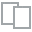
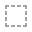
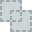
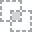
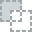
...
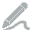
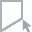
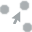
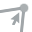
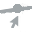

In [245]:
create_report(df)

# Split the data

In [362]:
df.head(3)

,age,sex,bmi,children,smoker,region,charges,Overweight,Normal,Underweight
0,19,0,27.90,0,1,3,16884.9240,1,0,0
1,18,1,33.77,1,0,2,1725.5523,1,0,0
2,28,1,33.00,3,0,2,4449.4620,1,0,0


In [363]:
df['Charges']=df['charges']

In [364]:
df = df.drop(columns='charges', axis=1)

In [365]:
X = df.iloc[:, 0:9].values
y = df.iloc[:, 9].values

In [366]:
X

array([[19.  ,  0.  , 27.9 , ...,  1.  ,  0.  ,  0.  ],
       [18.  ,  1.  , 33.77, ...,  1.  ,  0.  ,  0.  ],
       [28.  ,  1.  , 33.  , ...,  1.  ,  0.  ,  0.  ],
       ...,
       [18.  ,  0.  , 36.85, ...,  1.  ,  0.  ,  0.  ],
       [21.  ,  0.  , 25.8 , ...,  1.  ,  0.  ,  0.  ],
       [61.  ,  0.  , 29.07, ...,  1.  ,  0.  ,  0.  ]])

In [367]:
from sklearn.model_selection import train_test_split

In [368]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Linear Regression

In [253]:
from sklearn.linear_model import LinearRegression

In [254]:
regression = LinearRegression()
regression.fit(X_train, y_train)

LinearRegression()

In [255]:
y_pred = regression.predict(X_test)

In [256]:
regression.score(X_test,y_test)

0.7981706646693921

In [257]:
import statsmodels.api as sm
X = np.append(arr = np.ones((1338,1)).astype(int), values = X, axis = 1)
SL = 0.05

In [258]:
X_opt = X[:, [0, 1, 2, 3, 4, 5,6,7,8]]
regression_OLS = sm.OLS(endog = y, exog = X_opt.tolist()).fit()
regression_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     500.4
Date:                Tue, 25 Jan 2022   Prob (F-statistic):               0.00
Time:                        20:00:33   Log-Likelihood:                -13548.
No. Observations:                1338   AIC:                         2.711e+04
Df Residuals:                    1329   BIC:                         2.716e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.129e+04   1653.869     -6.829      0.000   -1.45e+04   -8049.666
x1           257.5193     11.917     21.609      0.000     234.141     280.897
x2          -129.7610    333.077     -0.390      0.697    -783.176     523.654
x3           332.1981     36.655      9.063      0.000     260.289     404.107
x4           479.9280    137.783      3.483      0.001     209.633     750.223
x5          2.382e+04    412.333     57.770      0.000     2.3e+04    2.46e+04
x6          -352.7615    152.062     -2.320      0.020    -651.069     -54.454
x7          -516.8545   1574.631     -0.328      0.743   -3605.887    2572.178
x8          -582.6688   1534.828     -0.380      0.704   -3593.618    2428.280
==============================================================================
Omnibus:                      299.778   Durbin-Watson:                   2.088
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              717.392
Skew:                           1.209   Prob(JB):                    1.66e-156
Kurtosis:                       5.650   Cond. No.                         793.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [259]:
X_opt = X[:, [0, 1, 3, 4, 5,6]]
regression_OLS = sm.OLS(endog = y, exog = X_opt.tolist()).fit()
regression_OLS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.751
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     802.2
Date:                Tue, 25 Jan 2022   Prob (F-statistic):               0.00
Time:                        20:00:33   Log-Likelihood:                -13548.
No. Observations:                1338   AIC:                         2.711e+04
Df Residuals:                    1332   BIC:                         2.714e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1.187e+04    945.876    -12.546      0.000   -1.37e+04      -1e+04
x1           257.4050     11.878     21.670      0.000     234.103     280.707
x2           332.0420     27.681     11.995      0.000     277.739     386.345
x3           478.4405    137.580      3.478      0.001     208.543     748.338
x4          2.381e+04    410.543     57.992      0.000     2.3e+04    2.46e+04
x5          -353.4491    151.878     -2.327      0.020    -651.395     -55.504
==============================================================================
Omnibus:                      299.380   Durbin-Watson:                   2.088
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              715.644
Skew:                           1.208   Prob(JB):                    3.98e-156
Kurtosis:                       5.646   Cond. No.                         293.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Ensemble

In [382]:
from sklearn import ensemble
clf = ensemble.GradientBoostingRegressor(n_estimators = 34, max_depth = 5, min_samples_split = 2,
          learning_rate = 0.1, loss = 'ls')

In [383]:
clf.fit(X_train, y_train)

GradientBoostingRegressor(loss='ls', max_depth=5, n_estimators=34)

In [384]:
clf.score(X_train,y_train)

0.9098381930328246

# Differents linear models

In [263]:
from sklearn.linear_model import LinearRegression # OLS algorithm
from sklearn.linear_model import Ridge # Ridge algorithm
from sklearn.linear_model import Lasso # Lasso algorithm
from sklearn.linear_model import BayesianRidge # Bayesian algorithm
from sklearn.linear_model import ElasticNet # ElasticNet algorithm


In [264]:
OLS = LinearRegression()
OLS.fit(X_train, y_train)
OLS_yhat = OLS.predict(X_test)

In [265]:
ridge = Ridge(alpha = 0.5)
ridge.fit(X_train, y_train)
ridge_yhat = ridge.predict(X_test)

In [266]:
lasso = Lasso(alpha = 0.01)
lasso.fit(X_train, y_train)
lasso_yhat = lasso.predict(X_test)

In [267]:
bayesian = BayesianRidge()
bayesian.fit(X_train, y_train)
bayesian_yhat = bayesian.predict(X_test)

In [268]:
en = ElasticNet(alpha = 0.01)
en.fit(X_train, y_train)
en_yhat = en.predict(X_test)

In [269]:
from termcolor import colored as cl # text customization

In [270]:
from sklearn.metrics import explained_variance_score as evs # evaluation metric
from sklearn.metrics import r2_score as r2 # evaluation metric

In [271]:
print(cl('EXPLAINED VARIANCE SCORE:', attrs = ['bold']))
print(cl('Explained Variance Score of OLS model is {}'.format(evs(y_test, OLS_yhat)), attrs = ['bold']))
print('-------------------------------------------------------------------------------')
print(cl('Explained Variance Score of Ridge model is {}'.format(evs(y_test, ridge_yhat)), attrs = ['bold']))
print('-------------------------------------------------------------------------------')
print(cl('Explained Variance Score of Lasso model is {}'.format(evs(y_test, lasso_yhat)), attrs = ['bold']))
print('-------------------------------------------------------------------------------')
print(cl('Explained Variance Score of Bayesian model is {}'.format(evs(y_test, bayesian_yhat)), attrs = ['bold']))
print('-------------------------------------------------------------------------------')
print(cl('Explained Variance Score of ElasticNet is {}'.format(evs(y_test, en_yhat)), attrs = ['bold']))
print('-------------------------------------------------------------------------------')

EXPLAINED VARIANCE SCORE:
Explained Variance Score of OLS model is 0.7984222714165611
-------------------------------------------------------------------------------
Explained Variance Score of Ridge model is 0.7982751545593081
-------------------------------------------------------------------------------
Explained Variance Score of Lasso model is 0.7984222724179312
-------------------------------------------------------------------------------
Explained Variance Score of Bayesian model is 0.7982495814022839
-------------------------------------------------------------------------------
Explained Variance Score of ElasticNet is 0.7963296313245245
-------------------------------------------------------------------------------


# Random forest

In [272]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = RandomForestRegressor(n_estimators=1000)
forest_fit = forest_reg.fit(X_train,y_train)
forest_pred = forest_fit.predict(X_test)

Text(0, 0.5, 'Predicted Y by Random Forest Regression')

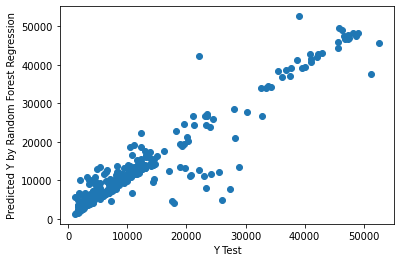

In [273]:
plt.scatter(y_test,forest_pred)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y by Random Forest Regression')

In [274]:
forest_reg.score(X_test,y_test)

0.8787373179669088

# Testing

In [319]:
df.head(3)

,age,sex,bmi,children,smoker,region,Overweight,Normal,Underweight,Charges
0,19,0,27.90,0,1,3,1,0,0,16884.9240
1,18,1,33.77,1,0,2,1,0,0,1725.5523
2,28,1,33.00,3,0,2,1,0,0,4449.4620


In [385]:
inp = np.array([30,1,33,3,0,2,1,0,0])

In [386]:
z = np.expand_dims(inp, axis=0)

In [387]:
clf.predict(z)

array([6116.21338686])

In [388]:
regression.predict(z)

array([7601.23122162])

In [389]:
forest_reg.predict(z)

array([6366.78054612])

In [390]:
mlp_reg.predict(z)

array([13201.18201038])